<a href="https://colab.research.google.com/github/VikkiSui1129/6289HW/blob/main/final_proj/Create_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir("/content/drive/MyDrive/statistical deep learning/project/model")
import sys
sys.path.append("/content/drive/MyDrive/statistical deep learning/project/model")

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import random
import math
import time
from datetime import datetime
import random

import pytorch_ssim # https://github.com/Po-Hsun-Su/pytorch-ssim

import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import IPython

### View Images

In [ ]:
class cv2torch():
  def __init__(self, args_data_norm):
    super(cv2torch).__init__()
    self.color = args_data_norm["color_field"]
    self.mean = np.asarray(args_data_norm["color_mean"])
    self.std = np.asarray(args_data_norm["color_std"])
  
  def __call__(self, img):
    if self.color == "YUV":
      img = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    elif self.color == "RGB":
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
      print("CV2Torch Color Field Error")

    img = img.clip(0, 255) / 255
    img = (img - self.mean) / self.std
    img = torch.tensor(img.transpose(2,0,1),dtype=torch.float32)
    return img

class torch2cv():
  def __init__(self, args_data_norm):
    super(torch2cv).__init__()
    self.color = args_data_norm["color_field"]
    self.mean = np.asarray(args_data_norm["color_mean"])
    self.std = np.asarray(args_data_norm["color_std"])
  
  def __call__(self, torch_img):
    img = torch_img.detach().cpu().numpy().transpose((1,2,0))
    img = (img * self.std) + self.mean
    img = img * 255
    img = img.clip(0, 255)
    img = np.asarray(img.round(), dtype=np.uint8)
    if self.color == "YUV":
      img = cv2.cvtColor(img, cv2.COLOR_YUV2BGR)
    elif self.color == "RGB":
      img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    else:
      print("Torch2CV Color Field Error")
    img = img.clip(0, 255)

    return img

class torch_inverse():
  def __init__(self, args_data_norm):
    super(torch_inverse).__init__()
    self.color = args_data_norm["color_field"]
    self.mean = torch.tensor(args_data_norm["color_mean"]).view(1,-1,1,1)
    self.std = torch.tensor(args_data_norm["color_std"]).view(1,-1,1,1)

  def __call__(self, torch_img):
    return torch_img * self.std + self.mean
  
  def change_device(self, device):
    self.mean = self.mean.to(device)
    self.std = self.std.to(device)
    

In [ ]:
args_data_norm = {}
args_data_norm["color_field"] = "YUV"
args_data_norm["color_mean"] = [0.5, 0.5, 0.5]
args_data_norm["color_std"] = [0.5, 0.5, 0.5]  

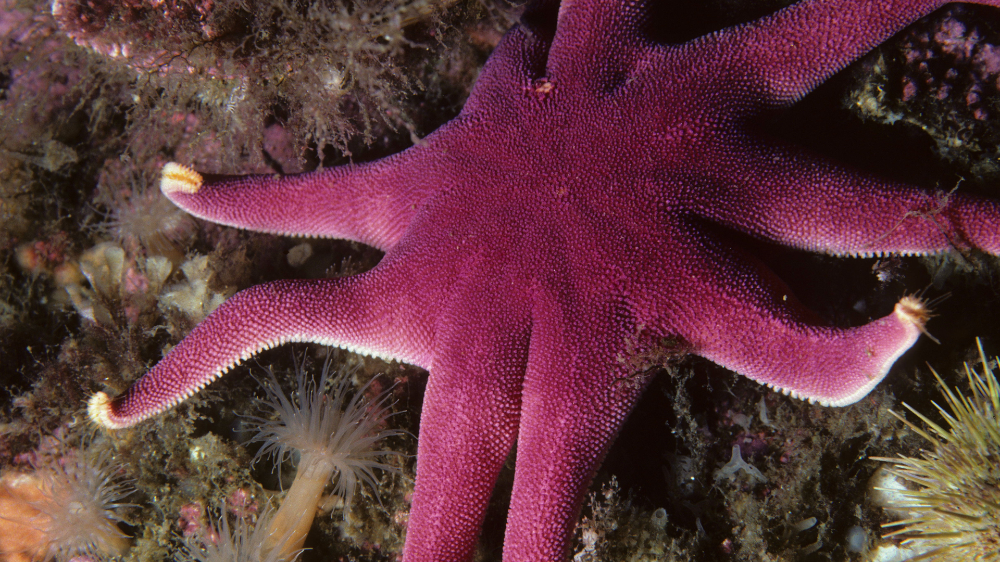

In [ ]:
image_path = "../data/aligned_data/train/0001.png"
image = cv2.imread(image_path)
cv2_imshow(image)

In [ ]:
c2t = cv2torch(args_data_norm)
t2c = torch2cv(args_data_norm)
tinv = torch_inverse(args_data_norm)

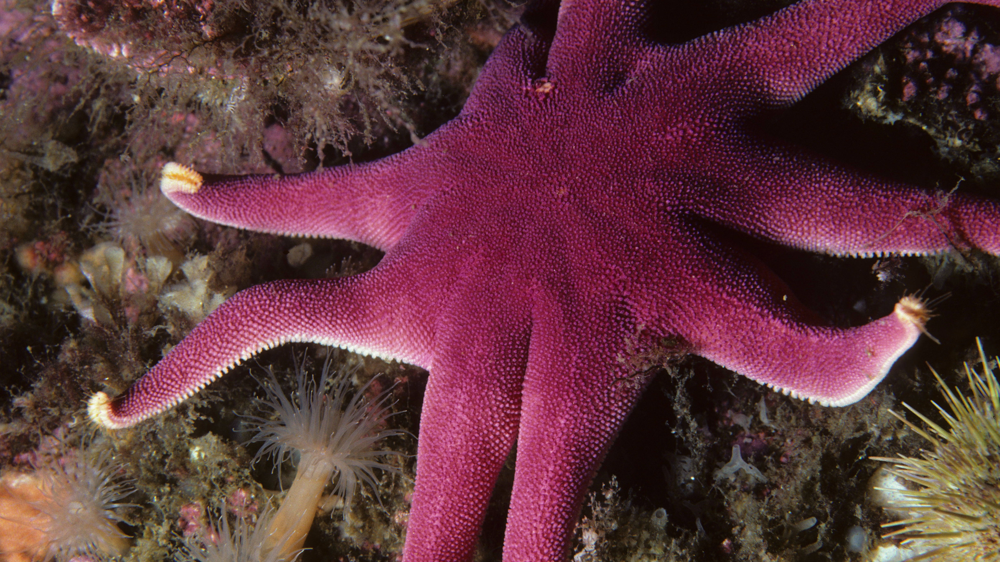

In [ ]:
torch_image = c2t(image)
image_back = t2c(torch_image)
cv2_imshow(image_back)

### Build Utils

In [ ]:
class timer():
    def __init__(self):
        super(timer, self).__init__()

        self.time_start = time.time()
        self.time_last = self.time_start
    
    def click(self):
        time_now = time.time()
        time_cost = time_now - self.time_last
        self.time_last = time_now
        return time_cost

class logger():
    def __init__(self, log_path, file_name='log.txt'):
        super(logger, self).__init__()
        self.folder_path = log_path
        name, suffix = file_name.split(".")
        timestr = datetime.strftime(datetime.now(), "%Y%m%d%H%M%S")
        file_name = name + "_" + timestr + "." + suffix
        self.file_name = file_name
        self.log_path = os.path.join(self.folder_path, self.file_name)
        if not os.path.exists(self.folder_path):
          os.makedirs(self.folder_path)

    def log(self, *args):
        print(*args)
        with open(self.log_path, 'a') as f:
            print(*args, file=f)

In [ ]:
timer = timer()
log = logger("../output/test")

### Build Dataloader

In [ ]:
def get_image_dataloader(phase, c2t, args_loader, args_basic, log):
    is_shuffle = phase == "Train"
    dataset = ImageDataset(phase, c2t, args_loader["dataset"], args_basic, log)
    dataloader = DataLoader(dataset, batch_size=args_loader["batch_size"],shuffle=is_shuffle, num_workers=args_loader["num_workers"], pin_memory=True, worker_init_fn=np.random.seed())

    return dataloader

In [ ]:
class ImageDataset(Dataset):
  def __init__(self, phase, c2t, args_dataset, args_basic, log):
    super(ImageDataset, self).__init__()
    log.log("===== Image Dataset Construction =====")
    log.log("Initializing dataset...")


    self.log = log
    self.phase = phase
    self.istrain = phase == "Train"
    self.c2t = c2t

    self.data_path = args_dataset["data_path"]
    self.repeat = args_dataset["repeat"]
    self.cache = args_dataset["cache"]
    self.augment = args_dataset["augment"]
    self.LR_mode = args_dataset["LR_mode"]

    self.n = args_basic["n"]
    self.HR_H = args_basic["HR_H"]
    self.HR_W = args_basic["HR_W"]
    self.LR_H = args_basic["LR_H"]
    self.LR_W = args_basic["LR_W"]

    self.tLR_H = args_dataset["H"]
    self.tLR_W = args_dataset["W"]
    self.tHR_H = self.tLR_H * self.n
    self.tHR_W = self.tLR_W * self.n

    assert(self.tLR_H <= self.LR_H)
    assert(self.tLR_W <= self.LR_W)

    files = os.listdir(self.data_path)
    image_list = []
    for f in files:
      image_path = os.path.join(self.data_path, f)
      if self.cache == "path":
          image_list.append(image_path)
      elif self.cache == "in_memory":
          image_list.append(cv2.imread(image_path))
      else:
          print("Dataset Cache Error")
    self.items = image_list
    self.num_samples = len(self.items)

    log.log("===== Summary =====")
    log.log("Color Field:", self.c2t.color)
    log.log("Repeat:", self.repeat)
    log.log("Resolution Scale {}x".format(self.n))
    log.log("Image Size H{}, W{}".format(self.HR_H, self.HR_W))
    log.log("Input Size H{}, W{}".format(self.tLR_H, self.tLR_W))
    log.log("Dataset path", self.data_path)
    log.log("Num Samples:", self.num_samples)

  def __getitem__(self, index):
    item = self.items[index % len(self.items)]
    
    if self.cache == "path":
      HR_path = item
      HR_ori = cv2.imread(HR_path)
    elif self.cache == "in_memory":
      HR_ori = item
    else:
      print("Dataset Cache Error")
    
    HR = c2t(HR_ori)
    # data augmentation
    if self.augment:
      hflip = random.random() < 0.5
      vflip = random.random() < 0.5
      HR = self.make_augment(HR, hflip, vflip)
    HR = HR.unsqueeze(0)
    if self.LR_mode == "bilinear":
      LR = F.interpolate(HR, (self.LR_H, self.LR_W), mode="bilinear", align_corners=False)
    elif self.LR_mode == "bicubic":
      LR = F.interpolate(HR, (self.LR_H, self.LR_W), mode="bicubic", align_corners=False)
    elif self.LR_mode == "nearest":
      LR = F.interpolate(HR, (self.LR_H, self.LR_W), mode="nearest")
    else:
      print("Dataset LR_mode Error")
    HR = HR.squeeze(0)
    LR = LR.squeeze(0)

    if self.istrain:
      x0 = random.randint(0, self.LR_W - self.tLR_W)
      y0 = random.randint(0, self.LR_H - self.tLR_H)
    else:
      x0 = 0
      y0 = 0

    HR = HR[:, (y0*self.n):(y0+self.tLR_H)*self.n, (x0*self.n):(x0+self.tLR_W)*self.n]
    LR = LR[:, y0:y0+self.tLR_H, x0:x0+self.tLR_W]

    return{
        "HR": HR,
        "LR": LR
    }
  
  def __len__(self):
    return len(self.items) * self.repeat

  def make_augment(self, x, hflip, vflip):
    if hflip:
      x = x.flip(-2)
    if vflip:
      x = x.flip(-1)
    return x

    

In [ ]:
args_train_dataset = {}
args_train_dataset["data_path"] = "../data/aligned_data/train"
args_train_dataset["repeat"] = 1
args_train_dataset["cache"] = "in_memory" # Use "in_memory" for loading all images first
args_train_dataset["augment"] = True
args_train_dataset["H"] = 108
args_train_dataset["W"] = 192
args_train_dataset["LR_mode"] = "bilinear"

args_train_dataloader = {}
args_train_dataloader["batch_size"] = 16
args_train_dataloader["num_workers"] = 1
args_train_dataloader["dataset"] = args_train_dataset

args_valid_dataset = {}
args_valid_dataset["data_path"] = "../data/aligned_data/valid"
args_valid_dataset["repeat"] = 1
args_valid_dataset["cache"] = "in_memory" # Use "in_memory" for loading all images first
args_valid_dataset["augment"] = False
args_valid_dataset["H"] = 540
args_valid_dataset["W"] = 960
args_valid_dataset["LR_mode"] = "bilinear" # Keep same as in train dataset

args_valid_dataloader = {}
args_valid_dataloader["batch_size"] = 1
args_valid_dataloader["num_workers"] = 1
args_valid_dataloader["dataset"] = args_valid_dataset

args_basic = {}
args_basic["n"] = 2
args_basic["HR_H"] = 1080
args_basic["HR_W"] = 1920
args_basic["LR_H"] = 540
args_basic["LR_W"] = 960



#### Check for correctness

In [ ]:
train_loader = get_image_dataloader("Train", c2t, args_train_dataloader, args_basic, log)

In [ ]:
for i, data in enumerate(train_loader):
  break

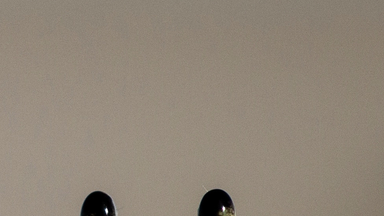

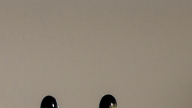

In [ ]:
cv2_imshow(t2c(data["HR"][0]))
cv2_imshow(t2c(data["LR"][0]))

### Build Network

In [ ]:
def default_conv(in_channels, out_channels, kernel_size, padding_mode="zeros", bias=True):
  return nn.Conv2d(
    in_channels, out_channels, kernel_size,
    padding=(kernel_size//2), padding_mode=padding_mode, bias=bias)

class ConvBlock(nn.Module):
  def __init__(
    self, in_channel, out_channel, kernel_size, padding_mode,
    bias=True, bn=False, act=nn.ReLU(True)):
    super(ConvBlock, self).__init__()

    m = []
    m.append(default_conv(in_channel, out_channel, kernel_size, padding_mode, bias=bias))
    if bn:
      m.append(nn.BatchNorm2d(out_channel))
    if act is not None:
      m.append(act)

    self.body = nn.Sequential(*m)

  def forward(self, x):
    return self.body(x)

class SRCNN(nn.Module):
  def __init__(self, HR_H, HR_W, tHR_H, tHR_W):
    super(SRCNN, self).__init__()

    self.train_Upsampler = nn.Upsample((tHR_H, tHR_W), mode="bilinear", align_corners=False)
    self.valid_Upsampler = nn.Upsample((HR_H, HR_W), mode="bilinear", align_corners=False)
    m = []
    m.append(ConvBlock(1, 128, 9, "reflect", bias=True, act=nn.ReLU(True)))
    m.append(ConvBlock(128, 64, 3, "replicate", bias=True, act=nn.ReLU(True)))
    m.append(ConvBlock(64, 1, 5, "reflect", bias=True, act=None))

    self.body = nn.Sequential(*m)
  
  def forward(self, x, is_train=True):
    if is_train:
      x = self.train_Upsampler(x)
    else:
      x = self.valid_Upsampler(x)
      
    return self.body(x)


#### Check Correctness

In [ ]:
h = 278
w = 396
LR = torch.randn(4, 1, h, w).cuda()
net = SRCNN(1080, 1920, h*2, w*2).cuda()
timer.click()
SR = net(LR)
print(SR.shape, timer.click())

torch.Size([4, 1, 556, 792]) 0.2315075397491455


### Backup Networks

Use different Networks to compare results i.e. Net=SRCNNPlus() or Net=ResCNN(),also you can change parameters inside networks

In [ ]:
class ConvTransBlock(nn.Module):
  def __init__(
    self, in_channel, out_channel, bn=False, act=nn.ReLU(True)):
    super(ConvTransBlock, self).__init__()

    m = []
    m.append(nn.ConvTranspose2d(in_channel, out_channel, 3, 2, padding=1, output_padding=1))
    if bn:
      m.append(nn.BatchNorm2d(out_channel))
    if act is not None:
      m.append(act)

    self.body = nn.Sequential(*m)

  def forward(self, x):
    return self.body(x)

class SRCNNPlus(nn.Module):
  # Only work for 2x super resolution
  def __init__(self):
    super(SRCNNPlus, self).__init__()

    m = []
    m.append(ConvBlock(1, 128, 9, "reflect", bias=True, act=nn.ReLU(True)))
    m.append(ConvBlock(128, 64, 3, "replicate", bias=True, act=nn.ReLU(True)))
    m.append(ConvTransBlock(64, 64, act=nn.ReLU(True)))
    m.append(ConvBlock(64, 1, 5, "reflect", bias=True, act=None))
    

    self.body = nn.Sequential(*m)
  
  def forward(self, x, is_train=True):
      
    return self.body(x)

In [ ]:
h = 278
w = 396
LR = torch.randn(4, 1, h, w).cuda()
net = SRCNNPlus().cuda()
timer.click()
SR = net(LR)
print(SR.shape, timer.click())

torch.Size([4, 1, 556, 792]) 0.03109264373779297


In [ ]:
# For res block https://arxiv.org/pdf/1512.03385.pdf
class ResBlock(nn.Module):
  def __init__(
    self, n_feats, kernel_size,
    bias=True, bn=False, act=nn.ReLU(True), res_scale=1):

    super(ResBlock, self).__init__()
    m = []
    for i in range(2):
      m.append(default_conv(n_feats, n_feats, kernel_size, bias=bias))
      if bn:
        m.append(nn.BatchNorm2d(n_feats))
      if i == 0:
        m.append(act)

    self.body = nn.Sequential(*m)
    self.res_scale = res_scale

  def forward(self, x):
    res = self.body(x).mul(self.res_scale)
    res += x

    return res

class Encoder_in(nn.Module):
  def __init__(self, in_channel, n_feats, kernel_size, num_layers, act=nn.ReLU(True), bn=False):
    super(Encoder_in, self).__init__()

    self.conv_in = nn.Sequential(*[default_conv(in_channel, n_feats, kernel_size), act])
    m = []
    for i in range(num_layers):
      m.append(ResBlock(n_feats, kernel_size, act=act, bn=bn))
    self.body = nn.Sequential(*m)
  
  def forward(self, x):
    x_in = self.conv_in(x)
    x_out = self.body(x_in)
    return x_out

class ResCNN(nn.Module):
  # Only work for 2x super resolution
  def __init__(self):
    super(ResCNN, self).__init__()

    m = []
    m.append(Encoder_in(1, 64, 3, 4, act=nn.ReLU(True)))
    m.append(ConvTransBlock(64, 64, act=nn.ReLU(True)))
    m.append(ConvBlock(64, 1, 5, "reflect", bias=True, act=None))
    
    self.body = nn.Sequential(*m)
  
  def forward(self, x, is_train=True):
      
    return self.body(x)

In [ ]:
h = 278
w = 396
LR = torch.randn(4, 1, h, w).cuda()
net = ResCNN().cuda()
timer.click()
SR = net(LR)
print(SR.shape, timer.click())

torch.Size([4, 1, 556, 792]) 0.013951539993286133


### Train Network

In [ ]:
class Train():
  def __init__(self, net, t2c, tinv, args_data_norm, args_train, timer, log):
    self.Net = net
    self.t2c = t2c
    self.tinv = tinv
    self.args_data_norm = args_data_norm
    self.args_train = args_train
    self.timer = timer
    self.log = log

    self.train_loader = None
    self.valid_loader = None
    self.device = "cpu"
    self.color_field = args_data_norm["color_field"]
    
    self.Loss = args_train["Loss"]
    self.Max_epoch = args_train["Max_epoch"]
    self.Save_per_epoch = args_train["Save_per_epoch"]
    self.Valid_per_epoch = args_train["Valid_per_epoch"]

    self.Model_save_path = args_train["Model_save_path"]
    self.Image_save_path = args_train["Image_save_path"]
    if not os.path.exists(self.Model_save_path):
      os.makedirs(self.Model_save_path)
    if not os.path.exists(self.Image_save_path):
      os.makedirs(self.Image_save_path)
    
    self.epoch = 0

    self.build_optimizer()
    self.build_loss()

    self.out = IPython.display.display(IPython.display.Pretty('Starting Training'), display_id=True)
    self.out_val = IPython.display.display(IPython.display.Pretty('Starting Validation'), display_id=True)

  def train(self):
    if self.train_loader is None or self.valid_loader is None:
      print("Build Dataloader First")
      return None
    
    loss_lst = []
    psnr_lst = []
    for epoch in range(self.epoch, self.Max_epoch):
      loss, psnr = self.train_one_epoch(epoch)
      loss_lst.append(loss)
      psnr_lst.append(psnr)
      if epoch % self.Save_per_epoch == self.Save_per_epoch - 1:
        self.save_model(epoch, self.Model_save_path)
      if epoch % self.Valid_per_epoch == self.Valid_per_epoch - 1:
        self.test(epoch)
    return loss_lst, psnr_lst

  def train_one_epoch(self, epoch):
    self.timer.click()

    running_loss = 0
    running_psnr = 0
    count = 0
    for i, data in enumerate(self.train_loader):
      HR = data["HR"].to(self.device)
      LR = data["LR"].to(self.device)

      if self.color_field == "RGB":
        HR_train = HR
        LR_train = LR
      elif self.color_field == "YUV":
        HR_train = HR[:,:1]
        LR_train = LR[:,:1]
      else:
        print("Color Field Error")
      
      SR = self.Net(LR_train, True)

      if self.Loss == "L1":
        loss = self.criterionL1(SR, HR_train)
      elif self.Loss == "L2":
        loss = self.criterionL2(SR, HR_train)
      else:
        print("Loss Error")
      
      SR_metric = self.tinv(SR.detach())
      HR_metric = self.tinv(HR_train.detach())

      psnr, _ = self.cal_psnr(SR_metric, HR_metric)

      self.optim.zero_grad()
      loss.backward()
      self.optim.step()

      running_loss += loss.item()
      running_psnr += psnr
      count += 1

      self.out.update(IPython.display.Pretty("[%d, %4d] Loss: %.6f PSNR: %.4f" % (epoch, i, loss, psnr)))

    self.scheduler_step()

    self.log.log("Epoch: %d, Loss: %.6f, PSNR: %.4f, Time: %.2f s" % (epoch, running_loss/count, running_psnr/count, self.timer.click()))
    return running_loss/count, running_psnr/count


  def test(self, epoch):
    self.timer.click()

    running_loss = 0
    running_psnr = 0
    running_mse = 0
    running_ssim = 0
    count = 0
    for i, data in enumerate(self.valid_loader):
      HR = data["HR"].to(self.device)
      LR = data["LR"].to(self.device)
      
      if self.color_field == "RGB":
        HR_train = HR
        LR_train = LR
      elif self.color_field == "YUV":
        HR_train = HR[:,:1]
        LR_train = LR[:,:1]
      else:
        print("Color Field Error")

      SR = self.Net(LR_train, False)

      if self.Loss == "L1":
        loss = self.criterionL1(SR, HR_train)
      elif self.Loss == "L2":
        loss = self.criterionL2(SR, HR_train)
      else:
        print("Loss Error")
      
      SR_metric = self.tinv(SR.detach())
      HR_metric = self.tinv(HR_train.detach())

      psnr, mse = self.cal_psnr(SR_metric, HR_metric)
      ssim = pytorch_ssim.ssim(SR_metric, HR_metric)

      self.out_val.update(IPython.display.Pretty("[%d, %4d] Validation Loss: %.6f PSNR: %.4f MSE: %.2f SSIM: %.6f" % (epoch, i, loss, psnr, mse * (255**2), ssim)))
      
      for j in range(SR.shape[0]):
        if self.color_field == "YUV":
          SR_uv = F.interpolate(LR[:,1:], (HR.shape[2], HR.shape[3]), mode="bilinear", align_corners=False)
          SR = torch.cat([SR, SR_uv], dim=1)
        SR_img = self.t2c(SR[j])
        folder_path = os.path.join(self.Image_save_path, "SR_Epoch{}".format(epoch))
        if not os.path.exists(folder_path):
          os.makedirs(folder_path)
        cv2.imwrite(os.path.join(folder_path, "{}.png".format(str(i*SR.shape[0]+j).zfill(4))), SR_img)

      running_loss += loss.item()
      running_psnr += psnr
      running_mse += mse * (255 ** 2)
      running_ssim += ssim
      count += 1
    
    self.log.log("Validation, Epoch: %d, Loss: %.6f, PSNR: %.4f, MSE: %.2f SSIM: %.6f Time: %.2f s" % (epoch, running_loss/count, running_psnr/count, running_mse/count, running_ssim/count, self.timer.click()))

  def cal_psnr(self, sr, hr, scale=1, rgb_range=1):
    diff = (sr - hr) / rgb_range
    shave = scale + 6
    valid = diff[..., shave:-shave, shave:-shave]
    mse = valid.pow(2).mean()
    return -10 * torch.log10(mse), mse

  def build_train_loader(self, data_loader):
    self.train_loader = data_loader
  
  def build_valid_loader(self, data_loader):
    self.valid_loader = data_loader

  def build_optimizer(self):
    args_optimizer = self.args_train["Optimizer"]
    self.args_optimizer = args_optimizer
    params = self.Net.parameters()

    if args_optimizer["name"] == "Adam":
      self.optim = optim.Adam(params, args_optimizer["lr"], betas=(args_optimizer["beta1"], args_optimizer["beta2"]))
    elif args_optimizer["name"] == "RMSprop":
      self.optim = optim.RMSprop(params, args_optimizer["lr"])
    elif args_optimizer["name"] == "SGD":
      self.optim = optim.SGD(params, args_optimizer["lr"])
    else:
      print("Optimizer Error")
    self.scheduler = torch.optim.lr_scheduler.MultiStepLR(self.optim, milestones=args_optimizer["milestones"], gamma=args_optimizer["gamma"])

    return self.optim
    
  def build_loss(self):
    self.criterionL1 = nn.L1Loss()
    self.criterionL2 = nn.MSELoss()

  def save_model(self, epoch, save_path):
    torch.save({
        'epoch': epoch,
        'model_state_dict': self.Net.state_dict(),
        'optimizer_state_dict': self.optim.state_dict(),
        'scheduler': self.scheduler,
    }, os.path.join(save_path, "weight.pth"))
    # print("Save model to", save_path)
  
  def load_model(self, load_path):
    checkpoint = torch.load(load_path)
    epoch_start = checkpoint['epoch']
    self.Net.load_state_dict(checkpoint['model_state_dict'])
    self.optim.load_state_dict(checkpoint['optimizer_state_dict'])
    self.scheduler = checkpoint['scheduler']
    self.epoch = epoch_start
    print("Load model from", load_path)

    return epoch_start
  
  def scheduler_step(self):
    self.scheduler.step()
    if self.scheduler._step_count in self.args_optimizer["milestones"]:
      print("Change Learning Rate to {}".format(self.scheduler._last_lr[0]))

  def change_device(self, device):
    self.device = device
    self.Net.to(device)
    self.tinv.change_device(device)

In [ ]:
args_optimizer = {}
args_optimizer["name"] = "Adam"
args_optimizer["lr"] = 0.001
args_optimizer["beta1"] = 0.9
args_optimizer["beta2"] = 0.999
args_optimizer["milestones"] = [100]
args_optimizer["gamma"] = 0.5

args_train = {}
args_train["Model_save_path"] = "../output/SRCNN"
args_train["Image_save_path"] = "../output/SRCNN/image/"
args_train["Max_epoch"] = 200
args_train["Optimizer"] = args_optimizer
args_train["Loss"] = "L1"
args_train["Save_per_epoch"] = 20
args_train["Valid_per_epoch"] = 20

### Run

In [ ]:
args = {}
args["basic"]  = args_basic
args["data_norm"] = args_data_norm
args["train"] = args_train
args["train_loader"] = args_train_dataloader
args["valid_loader"] = args_valid_dataloader

In [ ]:
log = logger(args["train"]["Model_save_path"])

In [ ]:
train_loader = get_image_dataloader("Train", c2t, args["train_loader"], args["basic"], log)
valid_loader = get_image_dataloader("Valid", c2t, args["valid_loader"], args["basic"], log)

===== Image Dataset Construction =====
Initializing dataset...
===== Summary =====
Color Field: YUV
Repeat: 1
Resolution Scale 2x
Image Size H1080, W1920
Input Size H108, W192
Dataset path ../data/aligned_data/train
Num Samples: 100
===== Image Dataset Construction =====
Initializing dataset...
===== Summary =====
Color Field: YUV
Repeat: 1
Resolution Scale 2x
Image Size H1080, W1920
Input Size H540, W960
Dataset path ../data/aligned_data/valid
Num Samples: 20


In [ ]:
my_net = SRCNN(args["valid_loader"]["dataset"]["H"]*args["basic"]["n"], args["valid_loader"]["dataset"]["W"]*args["basic"]["n"], args["train_loader"]["dataset"]["H"]*args["basic"]["n"], args["train_loader"]["dataset"]["W"]*args["basic"]["n"])
my_agent = Train(my_net, t2c, tinv, args["data_norm"], args["train"], timer, log) 
my_agent.build_train_loader(train_loader)
my_agent.build_valid_loader(valid_loader)
my_agent.change_device("cuda")
loss_SRCNN, psnr_SRCNN = my_agent.train()

[199,    6] Loss: 0.023817 PSNR: 35.2373

[199,   19] Validation Loss: 0.026999 PSNR: 32.7417 MSE: 34.59 SSIM: 0.945628

Epoch: 0, Loss: 0.177568, PSNR: 20.0221, Time: 10.34 s
Epoch: 1, Loss: 0.087779, PSNR: 23.7693, Time: 11.09 s
Epoch: 2, Loss: 0.081286, PSNR: 24.4547, Time: 14.13 s
Epoch: 3, Loss: 0.071863, PSNR: 25.2478, Time: 10.86 s
Epoch: 4, Loss: 0.062504, PSNR: 26.0622, Time: 11.16 s
Epoch: 5, Loss: 0.070070, PSNR: 25.6488, Time: 12.38 s
Epoch: 6, Loss: 0.060497, PSNR: 26.2056, Time: 12.69 s
Epoch: 7, Loss: 0.055699, PSNR: 27.3209, Time: 11.57 s
Epoch: 8, Loss: 0.056275, PSNR: 26.8943, Time: 10.60 s
Epoch: 9, Loss: 0.054519, PSNR: 27.1286, Time: 10.66 s
Epoch: 10, Loss: 0.064252, PSNR: 26.5805, Time: 10.76 s
Epoch: 11, Loss: 0.073957, PSNR: 25.3728, Time: 11.18 s
Epoch: 12, Loss: 0.073296, PSNR: 25.8819, Time: 13.52 s
Epoch: 13, Loss: 0.065620, PSNR: 27.1005, Time: 11.21 s
Epoch: 14, Loss: 0.057397, PSNR: 26.8229, Time: 10.25 s
Epoch: 15, Loss: 0.052814, PSNR: 27.6742, Time: 10.56 s
Epoch: 16, Loss: 0.054461, PSNR: 27.3907, Time: 10.51 s
Epoch: 17, Loss: 0.050435, PSNR: 27.1460, Time: 10.09 s
Ep

In [ ]:
import pandas as pd
df = pd.DataFrame({
    'loss' : loss_SRCNN,
    'psnr' : [i.tolist() for i in psnr_SRCNN]
})
df.to_csv('/content/drive/MyDrive/statistical deep learning/project/output/SRCNN.csv')

### SRCNNPlus

In [ ]:
args_optimizer = {}
args_optimizer["name"] = "Adam"
args_optimizer["lr"] = 0.001
args_optimizer["beta1"] = 0.9
args_optimizer["beta2"] = 0.999
args_optimizer["milestones"] = [100]
args_optimizer["gamma"] = 0.5

args_train = {}
args_train["Model_save_path"] = "../output/SRCNNPlus"
args_train["Image_save_path"] = "../output/SRCNNPlus/image/"
args_train["Max_epoch"] = 200
args_train["Optimizer"] = args_optimizer
args_train["Loss"] = "L1"
args_train["Save_per_epoch"] = 20
args_train["Valid_per_epoch"] = 20

args = {}
args["basic"]  = args_basic
args["data_norm"] = args_data_norm
args["train"] = args_train
args["train_loader"] = args_train_dataloader
args["valid_loader"] = args_valid_dataloader

log = logger(args["train"]["Model_save_path"])

In [ ]:
train_loader = get_image_dataloader("Train", c2t, args["train_loader"], args["basic"], log)
valid_loader = get_image_dataloader("Valid", c2t, args["valid_loader"], args["basic"], log)

===== Image Dataset Construction =====
Initializing dataset...
===== Summary =====
Color Field: YUV
Repeat: 1
Resolution Scale 2x
Image Size H1080, W1920
Input Size H108, W192
Dataset path ../data/aligned_data/train
Num Samples: 100
===== Image Dataset Construction =====
Initializing dataset...
===== Summary =====
Color Field: YUV
Repeat: 1
Resolution Scale 2x
Image Size H1080, W1920
Input Size H540, W960
Dataset path ../data/aligned_data/valid
Num Samples: 20


In [ ]:
my_net = SRCNNPlus()
my_agent = Train(my_net, t2c, tinv, args["data_norm"], args["train"], timer, log) 
my_agent.build_train_loader(train_loader)
my_agent.build_valid_loader(valid_loader)
my_agent.change_device("cuda")
loss_SRCNNPlus, psnr_SRCNNPlus = my_agent.train()

[199,    6] Loss: 0.030028 PSNR: 31.5416

[199,   19] Validation Loss: 0.026697 PSNR: 32.6629 MSE: 35.22 SSIM: 0.945129

Epoch: 0, Loss: 0.304996, PSNR: 14.9931, Time: 10.40 s
Epoch: 1, Loss: 0.158319, PSNR: 19.7027, Time: 10.17 s
Epoch: 2, Loss: 0.138856, PSNR: 20.3994, Time: 10.07 s
Epoch: 3, Loss: 0.105395, PSNR: 22.3826, Time: 10.58 s
Epoch: 4, Loss: 0.088188, PSNR: 23.2782, Time: 10.02 s
Epoch: 5, Loss: 0.084571, PSNR: 23.2180, Time: 10.36 s
Epoch: 6, Loss: 0.081839, PSNR: 23.6630, Time: 10.18 s
Epoch: 7, Loss: 0.073376, PSNR: 24.9619, Time: 9.85 s
Epoch: 8, Loss: 0.074906, PSNR: 24.1983, Time: 10.15 s
Epoch: 9, Loss: 0.085546, PSNR: 23.7123, Time: 10.37 s
Epoch: 10, Loss: 0.079591, PSNR: 23.9378, Time: 10.30 s
Epoch: 11, Loss: 0.079174, PSNR: 23.8218, Time: 10.34 s
Epoch: 12, Loss: 0.076142, PSNR: 24.6361, Time: 10.17 s
Epoch: 13, Loss: 0.074670, PSNR: 24.5496, Time: 10.17 s
Epoch: 14, Loss: 0.068812, PSNR: 25.1971, Time: 10.37 s
Epoch: 15, Loss: 0.067758, PSNR: 25.9324, Time: 10.17 s
Epoch: 16, Loss: 0.078123, PSNR: 24.2337, Time: 9.99 s
Epoch: 17, Loss: 0.067416, PSNR: 25.7631, Time: 10.08 s
Epoc

In [ ]:
df = pd.DataFrame({
    'loss' : loss_SRCNNPlus,
    'psnr' : [i.tolist() for i in psnr_SRCNNPlus]
})
df.to_csv('/content/drive/MyDrive/statistical deep learning/project/output/SRCNNPlus.csv')

### ResCNN

In [ ]:
args_optimizer = {}
args_optimizer["name"] = "Adam"
args_optimizer["lr"] = 0.001
args_optimizer["beta1"] = 0.9
args_optimizer["beta2"] = 0.999
args_optimizer["milestones"] = [100]
args_optimizer["gamma"] = 0.5

args_train = {}
args_train["Model_save_path"] = "../output/ResCNN"
args_train["Image_save_path"] = "../output/ResCNN/image/"
args_train["Max_epoch"] = 200
args_train["Optimizer"] = args_optimizer
args_train["Loss"] = "L1"
args_train["Save_per_epoch"] = 20
args_train["Valid_per_epoch"] = 20

args = {}
args["basic"]  = args_basic
args["data_norm"] = args_data_norm
args["train"] = args_train
args["train_loader"] = args_train_dataloader
args["valid_loader"] = args_valid_dataloader

log = logger(args["train"]["Model_save_path"])

In [ ]:
train_loader = get_image_dataloader("Train", c2t, args["train_loader"], args["basic"], log)
valid_loader = get_image_dataloader("Valid", c2t, args["valid_loader"], args["basic"], log)

===== Image Dataset Construction =====
Initializing dataset...
===== Summary =====
Color Field: YUV
Repeat: 1
Resolution Scale 2x
Image Size H1080, W1920
Input Size H108, W192
Dataset path ../data/aligned_data/train
Num Samples: 100
===== Image Dataset Construction =====
Initializing dataset...
===== Summary =====
Color Field: YUV
Repeat: 1
Resolution Scale 2x
Image Size H1080, W1920
Input Size H540, W960
Dataset path ../data/aligned_data/valid
Num Samples: 20


In [ ]:
my_net = ResCNN()
my_agent = Train(my_net, t2c, tinv, args["data_norm"], args["train"], timer, log) 
my_agent.build_train_loader(train_loader)
my_agent.build_valid_loader(valid_loader)
my_agent.change_device("cuda")
loss_ResCNN, psnr_ResCNN = my_agent.train()

[199,    6] Loss: 0.039364 PSNR: 29.2958

[199,   19] Validation Loss: 0.024624 PSNR: 33.2360 MSE: 30.87 SSIM: 0.949962

Epoch: 0, Loss: 0.353315, PSNR: 14.0471, Time: 11.92 s
Epoch: 1, Loss: 0.193715, PSNR: 18.0539, Time: 11.11 s
Epoch: 2, Loss: 0.163129, PSNR: 19.4318, Time: 10.96 s
Epoch: 3, Loss: 0.118311, PSNR: 21.7265, Time: 10.83 s
Epoch: 4, Loss: 0.093597, PSNR: 22.9605, Time: 10.86 s
Epoch: 5, Loss: 0.077412, PSNR: 24.6082, Time: 10.86 s
Epoch: 6, Loss: 0.093093, PSNR: 23.4553, Time: 11.14 s
Epoch: 7, Loss: 0.075059, PSNR: 25.1367, Time: 10.93 s
Epoch: 8, Loss: 0.072647, PSNR: 24.5474, Time: 11.24 s
Epoch: 9, Loss: 0.067667, PSNR: 25.3695, Time: 10.85 s
Epoch: 10, Loss: 0.060701, PSNR: 25.8636, Time: 11.17 s
Epoch: 11, Loss: 0.061479, PSNR: 25.7514, Time: 10.84 s
Epoch: 12, Loss: 0.057954, PSNR: 26.2904, Time: 10.85 s
Epoch: 13, Loss: 0.053823, PSNR: 26.6916, Time: 10.98 s
Epoch: 14, Loss: 0.053884, PSNR: 26.8046, Time: 10.93 s
Epoch: 15, Loss: 0.048010, PSNR: 27.8339, Time: 11.17 s
Epoch: 16, Loss: 0.048075, PSNR: 27.6305, Time: 10.99 s
Epoch: 17, Loss: 0.059465, PSNR: 27.3586, Time: 10.91 s
Ep

In [ ]:
df = pd.DataFrame({
    'loss' : loss_ResCNN,
    'psnr' : [i.tolist() for i in psnr_ResCNN]
})
df.to_csv('/content/drive/MyDrive/statistical deep learning/project/output/ResCNN.csv')

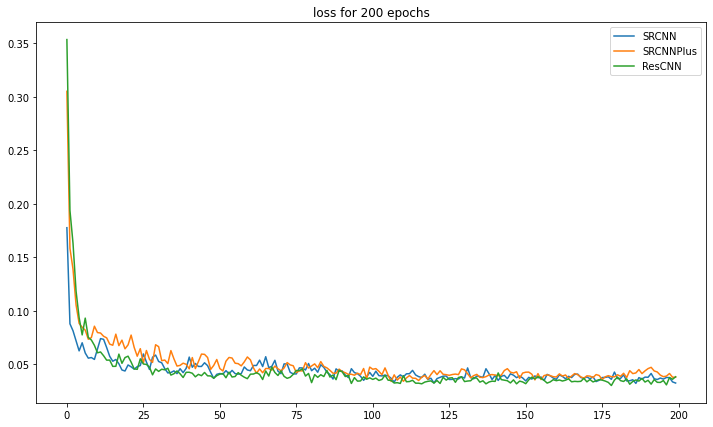

In [ ]:
plt.figure(figsize=(12,7))
plt.plot(loss_SRCNN, label='SRCNN')
plt.plot(loss_SRCNNPlus, label='SRCNNPlus')
plt.plot(loss_ResCNN, label='ResCNN')
plt.title('loss for 200 epochs')
plt.legend()
plt.show()

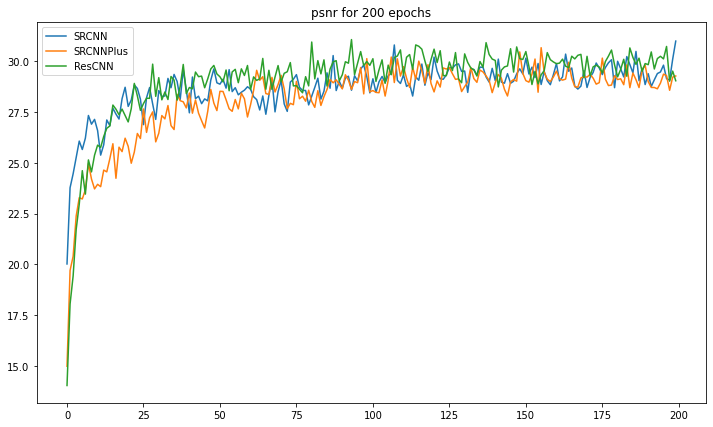

In [ ]:
plt.figure(figsize=(12,7))
plt.plot([i.tolist() for i in psnr_SRCNN], label='SRCNN')
plt.plot([i.tolist() for i in psnr_SRCNNPlus], label='SRCNNPlus')
plt.plot([i.tolist() for i in psnr_ResCNN], label='ResCNN')
plt.title('psnr for 200 epochs')
plt.legend()
plt.show()